<a href="https://colab.research.google.com/github/TessRedie/Project_image_classification/blob/master/Deep_learning__exercises_with_patrick.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Les fonctions d'activation

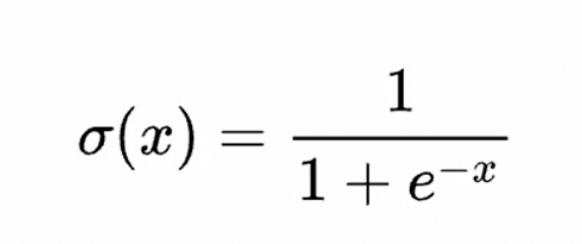

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# sigmoïd

def sigmoid1(x):
  return (1/(1 + np.exp(-x)))

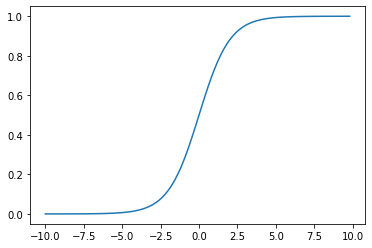

In [ ]:
x = np.arange(-10, 10, 0.2)
y = sigmoid1(x)

# print(x, "\n", y)

plt.plot(x, y)
plt.show()

In [ ]:
def sigmoid2(x):
  tableau = [] #list()
  for y in x:
    tableau.append(1/(1 + np.exp(-y)))
  return tableau

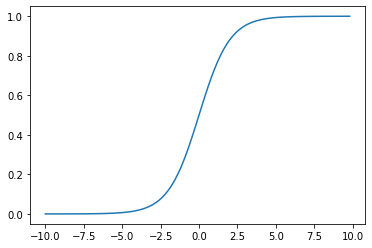

In [ ]:
x = np.arange(-10, 10, 0.2)
y = sigmoid2(x)

plt.plot(x, y)
plt.show()

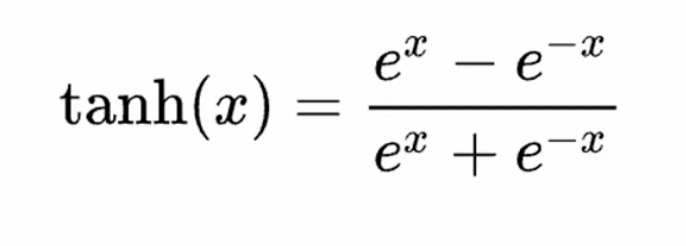

In [ ]:
def tanh(x):
  return ((np.exp(x)-np.exp(-x)) / (np.exp(x)+np.exp(-x)))

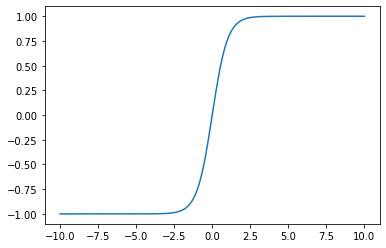

In [ ]:
x = np.linspace(-10, 10, 200)
y = tanh(x)
plt.plot(x, y)
plt.show()

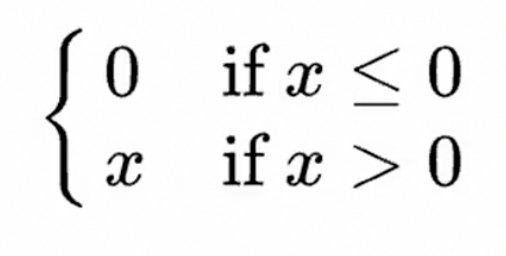

In [ ]:
def relu(x):
  if x > 0 :
    return x
  else:
    return 0

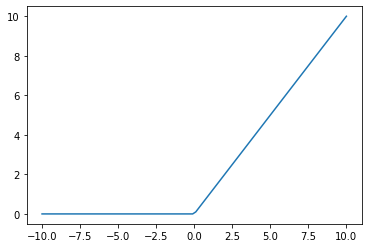

In [ ]:
X = np.linspace(-10, 10, 100)
y = [relu(i) for i in X]

plt.plot(x, y)
plt.show()

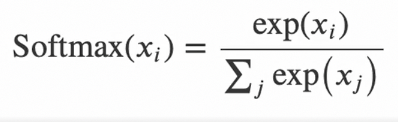

In [ ]:
def softmax(x1, x2):
  X1 = np.exp(x1)
  X2 = np.exp(x2)
  
  somme = sum(np.exp(x))
  return x/somme

# Un réseau de neurone à la mano

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
X = np.array([[1, 0, 1, 0], 
              [1, 0, 1, 1], 
              [0, 1, 0, 1]])
y = np.array([[1], 
              [1], 
              [0]])

In [ ]:
# fonction d'activation

def sigmoid1(x):
  return (1/(1 + np.exp(-x)))

# Sa dérivé pour la rétropropagation

def deriv_sigmoid1(x):
  # Rappel : dérivé de x : x * (1 - x)
  return (1/(1 + np.exp(-x))) * (1 - ((1/(1 + np.exp(-x)))))
  # return sigmoid1(x) * (1 - sigmoid1(x))

def rn(X,
      y,
      epochs=5000, 
      taux_appr=0.1, 
      neurones_couche_entree = 4,
      neurones_couche_cachee = 3,
      neurores_couche_sortie = 1):
    
    poids_couche_entree = np.random.uniform(size=(neurones_couche_entree,
                                          neurones_couche_cachee))
    

    biais_poids_couche_entree = np.random.uniform(size=(1, 
                                    neurones_couche_cachee)) 

    poids_couche_sortie = np.random.uniform(size=(neurones_couche_cachee,
                                          neurores_couche_sortie))
  
    biais_poids_couche_sortie = np.random.uniform(size=(1,
                                               neurores_couche_sortie))
    
    for i in range(epochs):
      
      # Propagation

      entree_couche_cachee = np.dot(X, 
                                             poids_couche_entree)
      activation_couche_cachee = sigmoid1(entree_couche_cachee)
      entre_couche_sortie = np.dot(activation_couche_cachee,
                                            poids_couche_sortie)
      sortie = sigmoid1(entre_couche_sortie)

      # Rétro-propagation

      E = y - sortie 
      pente_couche_sortie = deriv_sigmoid1(sortie)
      pente_couche_cachee = deriv_sigmoid1(activation_couche_cachee)
      d_sortie = E * pente_couche_sortie
      Erreur_couche_cachee = d_sortie.dot(poids_couche_sortie.T)
      d_couche_cachee = Erreur_couche_cachee * pente_couche_cachee
      poids_couche_sortie += activation_couche_cachee.T.dot(d_sortie) * taux_appr
      poids_couche_entree += X.T.dot(d_couche_cachee) * taux_appr
      biais_poids_couche_entree += np.sum(d_couche_cachee, axis=0, keepdims=True) * taux_appr
      biais_poids_couche_sortie +=  np.sum(d_sortie, axis=0, keepdims=True) * taux_appr
      

    print(f"y : {y} \n Résultat du model : {sortie}")

In [ ]:
rn(X, y)

y : [[1]
 [1]
 [0]] 
 Résultat du model : [[0.99663169]
 [0.99386085]
 [0.00977288]]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
sns.load_dataset('titanic')

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,0,13.0000,S,Second,man,True,NaN,Southampton,no,True
887,1,1,female,19.0,0,0,30.0000,S,First,woman,False,B,Southampton,yes,True
888,0,3,female,NaN,1,2,23.4500,S,Third,woman,False,NaN,Southampton,no,False
889,1,1,male,26.0,0,0,30.0000,C,First,man,True,C,Cherbourg,yes,True


In [ ]:
titanic = sns.load_dataset('titanic')
titanic = titanic[['survived', 'pclass', 'sex', 'age']]
titanic.dropna(axis=0, inplace=True)
titanic['sex'].replace(['male', 'female'], [0, 1], inplace=True)
titanic.head()

,survived,pclass,sex,age
0,0,3,0,22.0
1,1,1,1,38.0
2,1,3,1,26.0
3,1,1,1,35.0
4,0,3,0,35.0


In [ ]:
model = KNeighborsClassifier()
y = titanic['survived']
X = titanic.drop('survived', axis=1)

model.fit(X, y) 
model.score(X, y)

0.8305322128851541

## Exercice : Faite en sorte que le réseau de neurores s'entraîne sur les données du titanic (uniquement les valeurs numériques ainsi que la colonne sexe), et afficher son score de prédiction global (exemple via un MSE)

# Gradient descent

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

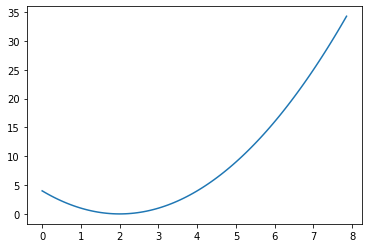

In [ ]:
x = np.linspace(0, 2.5*np.pi, 100)
y = (x-2)**2
plt.plot(x, y)
plt.show()

In [ ]:
x_init = 1 # Valeur à partir de laquelle commence la descente
x_cour = x_init
taux = 0.3 # Le pas d'avancement dans la direction inverse du gradient
precision = 10e-5 # La condition d'arrêt de l'algo 0.000001
ecart_etape = 1
max_iter = 10e5 # Le nombre maximum d'itération
iter_c = 0 # Le compteur d'itération, initialisé à 0
grad = lambda x: 2*(x-2) # Notre fonction
while ecart_etape > precision and iter_c < max_iter:
  x_prec = x_cour
  x_cour = x_cour - taux * grad(x_prec)
  ecart_etape = abs(x_cour - x_prec)
  iter_c += 1
  print(f"Iteration {iter_c} \n La valeur de X est {x_cour}")

print(f"Le minimum de ma fonction est", x_cour)

Iteration 1 
 La valeur de X est 1.6
Iteration 2 
 La valeur de X est 1.84
Iteration 3 
 La valeur de X est 1.936
Iteration 4 
 La valeur de X est 1.9744
Iteration 5 
 La valeur de X est 1.98976
Iteration 6 
 La valeur de X est 1.995904
Iteration 7 
 La valeur de X est 1.9983616
Iteration 8 
 La valeur de X est 1.99934464
Iteration 9 
 La valeur de X est 1.9997378559999999
Iteration 10 
 La valeur de X est 1.9998951424
Iteration 11 
 La valeur de X est 1.99995805696
Le minimum de ma fonction est 1.99995805696


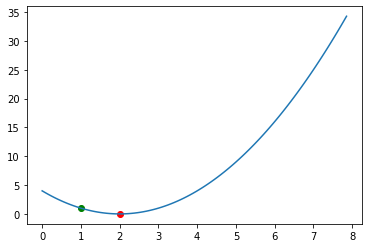

In [ ]:
x = np.linspace(0, 2.5*np.pi, 100)
y = (x-2)**2
y_init = (x_init - 2)**2
y_cour = (x_cour - 2)**2
plt.plot(x_init, y_init, "go")
plt.plot(x_cour, y_cour, "ro")
plt.plot(x, y)
plt.show()

## Exercice : coder un gradient descent permettant de trouver le minimum global d'une fonction plus complexe (ayant plusieurs minimum). Afficher le graphique montrant le départ de la recherche et le minimum trouvé

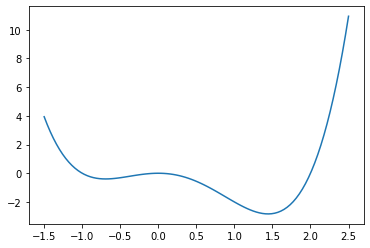

In [ ]:
x = np.linspace(-1.5, 2.5, 100)
y = (x-2) * (x+1) * x**2
plt.plot(x, y)
plt.show()

# Construire un classifier qui va prédire un avis (positif vs. négatif) pour chaque film IMDB (Internet Movie DataBase)


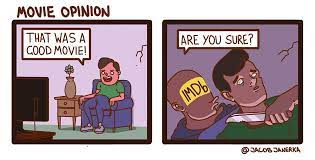

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from keras.datasets import imdb # Le dataset
from keras.preprocessing import sequence # Pour pader les datas
from keras.models import Sequential # Pour créer le model avec les couches de neurones
from keras.layers.embeddings import Embedding # Un type de couche adapté aux données textuelles (text mining)
from keras.layers import Flatten, Dense

seed = 12345
np.random.seed(seed)

In [ ]:
(X_train, y_train), (X_test, y_test) = imdb.load_data(num_words = 1000)

In [ ]:
help(imdb.load_data)

Help on function load_data in module keras.datasets.imdb:

load_data(path='imdb.npz', num_words=None, skip_top=0, maxlen=None, seed=113, start_char=1, oov_char=2, index_from=3, **kwargs)
    Loads the [IMDB dataset](https://ai.stanford.edu/~amaas/data/sentiment/).
    
    This is a dataset of 25,000 movies reviews from IMDB, labeled by sentiment
    (positive/negative). Reviews have been preprocessed, and each review is
    encoded as a list of word indexes (integers).
    For convenience, words are indexed by overall frequency in the dataset,
    so that for instance the integer "3" encodes the 3rd most frequent word in
    the data. This allows for quick filtering operations such as:
    "only consider the top 10,000 most
    common words, but eliminate the top 20 most common words".
    
    As a convention, "0" does not stand for a specific word, but instead is used
    to encode any unknown word.
    
    Args:
      path: where to cache the data (relative to `~/.keras/dataset`).

In [ ]:
# Keras encode chaque mot du data set selon sa fréquence d'utilisation
# Donc le 1er mot qui 
X_train

array([list([1, 14, 22, 16, 43, 530, 973, 2, 2, 65, 458, 2, 66, 2, 4, 173, 36, 256, 5, 25, 100, 43, 838, 112, 50, 670, 2, 9, 35, 480, 284, 5, 150, 4, 172, 112, 167, 2, 336, 385, 39, 4, 172, 2, 2, 17, 546, 38, 13, 447, 4, 192, 50, 16, 6, 147, 2, 19, 14, 22, 4, 2, 2, 469, 4, 22, 71, 87, 12, 16, 43, 530, 38, 76, 15, 13, 2, 4, 22, 17, 515, 17, 12, 16, 626, 18, 2, 5, 62, 386, 12, 8, 316, 8, 106, 5, 4, 2, 2, 16, 480, 66, 2, 33, 4, 130, 12, 16, 38, 619, 5, 25, 124, 51, 36, 135, 48, 25, 2, 33, 6, 22, 12, 215, 28, 77, 52, 5, 14, 407, 16, 82, 2, 8, 4, 107, 117, 2, 15, 256, 4, 2, 7, 2, 5, 723, 36, 71, 43, 530, 476, 26, 400, 317, 46, 7, 4, 2, 2, 13, 104, 88, 4, 381, 15, 297, 98, 32, 2, 56, 26, 141, 6, 194, 2, 18, 4, 226, 22, 21, 134, 476, 26, 480, 5, 144, 30, 2, 18, 51, 36, 28, 224, 92, 25, 104, 4, 226, 65, 16, 38, 2, 88, 12, 16, 283, 5, 16, 2, 113, 103, 32, 15, 16, 2, 19, 178, 32]),
       list([1, 194, 2, 194, 2, 78, 228, 5, 6, 2, 2, 2, 134, 26, 4, 715, 8, 118, 2, 14, 394, 20, 13, 119, 954, 189,

In [ ]:
# 1 = positif / 0 = negatif
y_train

array([1, 0, 0, ..., 0, 1, 0])

On va pader les séquences. C'est à dire tronquer les séquences trop longues et compléter par des 0 (par défaut) les séquences trop courtes pour obtenir un array 2D de taille fixe

In [ ]:
X_train = sequence.pad_sequences(X_train, maxlen=100)
X_test = sequence.pad_sequences(X_test, maxlen=100)

In [ ]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(25000, 100) (25000,)
(25000, 100) (25000,)


In [ ]:
# y_train = y_train.reshape((-1,1))
# y_train

In [ ]:
# y_test = y_test.reshape((-1,1))
# y_test

Couche embedding :     
* nombre de mots pris en compte > voc_size
* un vecteur de dimension > output_dim
* la longueur des séquences > input_lenght

In [ ]:
voc_size = 1000
output_dim = 32
input_lenght = 100

In [ ]:
model = Sequential()
model.add(Embedding(voc_size, 
                    output_dim = output_dim, 
                    input_length = input_lenght))

model.add(Flatten())

model.add(Dense(10, activation="relu"))
model.add(Dense(10, activation="sigmoid"))

model.add(Flatten())

model.compile(loss="binary_crossentropy",
              optimizer="adam",
              metrics=["accuracy"])

In [ ]:
model.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_11 (Embedding)    (None, 100, 32)           32000     
                                                                 
 flatten_15 (Flatten)        (None, 3200)              0         
                                                                 
 dense_22 (Dense)            (None, 10)                32010     
                                                                 
 dense_23 (Dense)            (None, 10)                110       
                                                                 
 flatten_16 (Flatten)        (None, 10)                0         
                                                                 
Total params: 64,120
Trainable params: 64,120
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history = model.fit(X_train, 
                    y_train, 
                    validation_data=(X_test, y_test), 
                    epochs = 10)

Epoch 1/10
782/782 [==============================] - 4s 4ms/step - loss: 0.4826 - accuracy: 0.1154 - val_loss: 0.3740 - val_accuracy: 0.1257
Epoch 2/10
782/782 [==============================] - 3s 4ms/step - loss: 0.3411 - accuracy: 0.1143 - val_loss: 0.3818 - val_accuracy: 0.0696
Epoch 3/10
782/782 [==============================] - 3s 4ms/step - loss: 0.2714 - accuracy: 0.0991 - val_loss: 0.4272 - val_accuracy: 0.0856
Epoch 4/10
782/782 [==============================] - 3s 4ms/step - loss: 0.1845 - accuracy: 0.0943 - val_loss: 0.5245 - val_accuracy: 0.0769
Epoch 5/10
782/782 [==============================] - 3s 4ms/step - loss: 0.1017 - accuracy: 0.0893 - val_loss: 0.6258 - val_accuracy: 0.0655
Epoch 6/10
782/782 [==============================] - 3s 4ms/step - loss: 0.0482 - accuracy: 0.0886 - val_loss: 0.7612 - val_accuracy: 0.0532
Epoch 7/10
782/782 [==============================] - 3s 4ms/step - loss: 0.0215 - accuracy: 0.0748 - val_loss: 0.8732 - val_accuracy: 0.0519
Epoch 

In [ ]:
scores = model.evaluate(X_test, y_test, verbose=0)
print("Acc =  %.2f%%" % (scores[1]*100))

# 85% / 90% / Résultat réell = 78.74%

Acc =  7.62%


In [ ]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

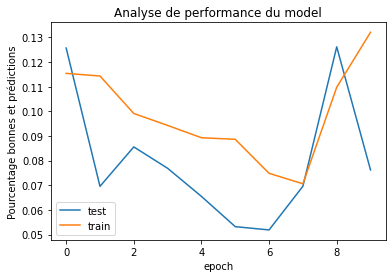

In [ ]:
plt.plot(history.history["val_accuracy"])
plt.plot(history.history["accuracy"])
plt.title("Analyse de performance du model")
plt.xlabel("epoch")
plt.ylabel("Pourcentage bonnes et prédictions")
plt.legend(["test", "train"])

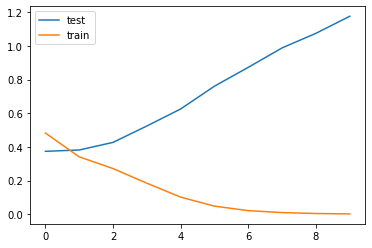

In [ ]:
plt.plot(history.history["val_loss"])
plt.plot(history.history["loss"])
plt.legend(["test", "train"])

# La fonction d'erreur est croissante sur les epoch

## Exercice : Augmenter le score pour atteindre entre 85 et 90%

Analyser vos données pour le sur-apprentissage

In [ ]:
from keras import regularizers

model = Sequential()
model.add(Embedding(voc_size, 
                    output_dim = output_dim, 
                    input_length = input_lenght))

model.add(Flatten())
model.add(Dense(10, activation="relu"))

# sigmoid pour séparer la décision entre vrai et faux
# Limiter/Diminuer le sur-apprentissage
model.add(Dense(1, activation="sigmoid", kernel_regularizer=regularizers.L1(0.01)))
model.add(Flatten())

model.compile(loss="binary_crossentropy", #
              optimizer="adam", # pour découvrir les poids optimaux
              metrics=["accuracy"])

In [ ]:
history = model.fit(X_train, 
                    y_train, 
                    validation_data=(X_test, y_test), 
                    epochs = 10,
                    batch_size=64)

Epoch 1/10
391/391 [==============================] - 3s 7ms/step - loss: 0.3777 - accuracy: 0.3323 - val_loss: 0.4124 - val_accuracy: 0.3576
Epoch 2/10
391/391 [==============================] - 2s 5ms/step - loss: 0.3462 - accuracy: 0.3599 - val_loss: 0.4220 - val_accuracy: 0.3988
Epoch 3/10
391/391 [==============================] - 3s 7ms/step - loss: 0.3116 - accuracy: 0.3949 - val_loss: 0.4319 - val_accuracy: 0.4793
Epoch 4/10
391/391 [==============================] - 2s 5ms/step - loss: 0.2692 - accuracy: 0.4187 - val_loss: 0.4675 - val_accuracy: 0.4902
Epoch 5/10
391/391 [==============================] - 2s 5ms/step - loss: 0.2224 - accuracy: 0.4276 - val_loss: 0.5206 - val_accuracy: 0.4977
Epoch 6/10
391/391 [==============================] - 2s 5ms/step - loss: 0.1803 - accuracy: 0.4463 - val_loss: 0.5732 - val_accuracy: 0.5346
Epoch 7/10
391/391 [==============================] - 2s 5ms/step - loss: 0.1452 - accuracy: 0.4833 - val_loss: 0.6357 - val_accuracy: 0.5558
Epoch 

In [ ]:
scores = model.evaluate(X_test, y_test, verbose=0)
print("Acc =  %.2f%%" % (scores[1]*100))

# 85% / 90% / Résultat réell = 78.74%

Acc =  57.10%


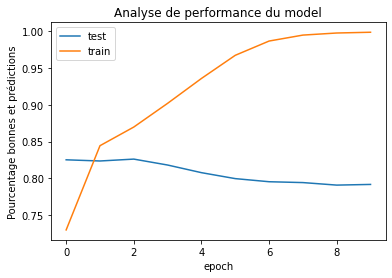

In [ ]:
plt.plot(history.history["val_accuracy"])
plt.plot(history.history["accuracy"])
plt.title("Analyse de performance du model")
plt.xlabel("epoch")
plt.ylabel("Pourcentage bonnes et prédictions")
plt.legend(["test", "train"])

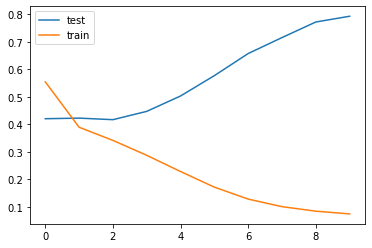

In [ ]:
plt.plot(history.history["val_loss"])
plt.plot(history.history["loss"])
plt.legend(["test", "train"])

# La fonction d'erreur est croissante sur les epoch

## Exercice : Pouvez vous me donner le nombre total de paramètre de ce réseaux

# Mini projet Zalando

In [ ]:
import pandas as pd 
import numpy as np 
from matplotlib import pyplot as plt 
from tensorflow.keras.utils import to_categorical 
from sklearn.model_selection import train_test_split 
from keras.models import Sequential 
from keras.layers import Dense, Dropout, Flatten 
from keras.layers import Conv2D, MaxPooling2D 
import keras

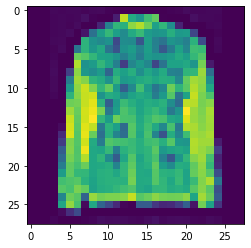

In [ ]:
#Définition de la longueur et de la largeur de l'image 
LONGUEUR_IMAGE = 28 
LARGEUR_IMAGE = 28 
 
#Chargement des images 
observations_entrainement = pd.read_csv('fashion-mnist_train.csv') 
observations_test = pd.read_csv('fashion-mnist_test.csv') 
 
#On exclut la première colonne (les labels) pour constituer un 
# tableau de pixels  
X = np.array(observations_entrainement.iloc[:, 1:]) 
 
premiereImage = X[5] 
premiereImage = premiereImage.reshape([LONGUEUR_IMAGE, LARGEUR_IMAGE])
plt.imshow(premiereImage) 
plt.show() 

In [ ]:
observations_entrainement.label

0        2
1        9
2        6
3        0
4        3
        ..
59995    9
59996    1
59997    8
59998    8
59999    7
Name: label, Length: 60000, dtype: int64

In [ ]:
print(observations_entrainement.shape)
print(observations_test.shape)

(60000, 785)
(10000, 785)


In [ ]:
# On crée des catégories à l'aide du module Keras 
y = to_categorical(observations_entrainement.iloc[:, 0].values) 
 
# Répartition des données d'entrainement en données 
# d'apprentissage et données de validation 
# 80% de donnée d'apprentissage et 20% de donnée de validation 
X_apprentissage, X_validation, y_apprentissage, y_validation = train_test_split(X, y, test_size=0.2, random_state=13) 


# On redimensionne les images au format 28*28 et 
# on réalise un scaling sur les données des pixels 
X_apprentissage = X_apprentissage.reshape(X_apprentissage.shape[0],
                                          LARGEUR_IMAGE,
                                          LONGUEUR_IMAGE, 
                                          1).astype('float32') 
X_apprentissage /= 255 

X_validation = X_validation.reshape(X_validation.shape[0],
                                    LARGEUR_IMAGE,
                                    LONGUEUR_IMAGE,
                                    1).astype('float32')
X_validation /= 255


X_test = observations_test.iloc[:, 1:].values
y_test = to_categorical(observations_test.iloc[:, 1:].values) 
 
X_test = X_test.reshape(X_test.shape[0], 
                        LARGEUR_IMAGE,
                        LONGUEUR_IMAGE,
                        1).astype('float32')  
X_test /= 255 


In [ ]:
LARGEUR_IMAGE = 28
LONGUEUR_IMAGE = 28

dimentionImage = (LARGEUR_IMAGE, LONGUEUR_IMAGE, 1) 

#On crée le réseau de neurones couche par couche 
reseauNeurone1Convolution = Sequential() 
 
#1- Ajout de la couche de convolution comportant 
#  32 filtres de de taille 3x3 (Kernel) parcourant l'image 
#  Une fonction d'activation de type ReLU (Rectified Linear Activation) 
#  Une image d'entrée de 28px * 28 px  
reseauNeurone1Convolution.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=dimentionImage)) 
 
#2- Définition de la fonction de pooling avec une fenêtre de 2px sur 2 px 
reseauNeurone1Convolution.add(MaxPooling2D(pool_size=(2, 2))) 
 
#3- Ajout d'une fonction d'ignorance 
reseauNeurone1Convolution.add(Dropout(0.2)) 
 
#5 - On transforme en une seule ligne 
reseauNeurone1Convolution.add(Flatten()) 
 
#6 - Ajout d'un réseau de neurones composé de 128 neurones avec une fonction d'activation de type ReLU 
reseauNeurone1Convolution.add(Dense(128, activation='relu')) 
 
#7 - Ajout d'un réseau de neurones composé de 10 neurones avec une fonction d'activation de type softmax 
reseauNeurone1Convolution.add(Dense(10, activation='softmax'))

In [ ]:
reseauNeurone1Convolution.compile(loss=keras.losses.categorical_crossentropy, 
                                  optimizer="adam", 
                                  metrics=['accuracy'])

In [ ]:
historique_apprentissage = reseauNeurone1Convolution.fit(X_apprentissage, 
        y_apprentissage, 
        batch_size=256, 
        epochs=10, 
        verbose=1, 
        validation_data=(X_validation, y_validation)) 

Epoch 1/10
188/188 [==============================] - 24s 123ms/step - loss: 0.5446 - accuracy: 0.8114 - val_loss: 0.3781 - val_accuracy: 0.8673
Epoch 2/10
188/188 [==============================] - 23s 121ms/step - loss: 0.3471 - accuracy: 0.8774 - val_loss: 0.3359 - val_accuracy: 0.8818
Epoch 3/10
188/188 [==============================] - 23s 121ms/step - loss: 0.3088 - accuracy: 0.8897 - val_loss: 0.3201 - val_accuracy: 0.8885
Epoch 4/10
188/188 [==============================] - 23s 121ms/step - loss: 0.2816 - accuracy: 0.8993 - val_loss: 0.2852 - val_accuracy: 0.8975
Epoch 5/10
188/188 [==============================] - 23s 121ms/step - loss: 0.2618 - accuracy: 0.9073 - val_loss: 0.2753 - val_accuracy: 0.9018
Epoch 6/10
188/188 [==============================] - 23s 121ms/step - loss: 0.2474 - accuracy: 0.9109 - val_loss: 0.2772 - val_accuracy: 0.8985
Epoch 7/10
188/188 [==============================] - 23s 122ms/step - loss: 0.2353 - accuracy: 0.9155 - val_loss: 0.2600 - val_ac

In [ ]:
print(f"{X_validation.shape} / {y.shape}\n {X_test.shape} / {y_test.shape}")

(12000, 28, 28, 1) / (60000, 10)
 (10000, 28, 28, 1) / (10000, 784, 256)


Pour que le code ci-dessous fonctionne il faut régler le problème de shape par rapport au y_test, je vous laisse le faire 😏

In [ ]:
evaluation = reseauNeurone1Convolution.evaluate(X_test, 
                                                y_test) 
print('Erreur:', evaluation[0]) 
print('Précision:', evaluation[1]) 

In [ ]:
plt.plot(historique_apprentissage.history['acc']) 
plt.plot(historique_apprentissage.history['val_acc']) 
plt.title('Précision du modèle') 
plt.ylabel('Précision') 
plt.xlabel('Epoch') 
plt.legend(['Apprentissage', 'Test'], loc='upper left') 
plt.show() 
 
# Plot training & validation loss values 
plt.plot(historique_apprentissage.history['loss']) 
plt.plot(historique_apprentissage.history['val_loss']) 
plt.title('Erreur') 
plt.ylabel('Erreur') 
plt.xlabel('Epoch') 
plt.legend(['Apprentissage', 'Test'], loc='upper left') 
plt.show() 

# Faire de la régression avec du Deep learning

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import folium

In [ ]:
data = fetch_california_housing()
data

{'DESCR': '.. _california_housing_dataset:\n\nCalifornia Housing dataset\n--------------------------\n\n**Data Set Characteristics:**\n\n    :Number of Instances: 20640\n\n    :Number of Attributes: 8 numeric, predictive attributes and the target\n\n    :Attribute Information:\n        - MedInc        median income in block group\n        - HouseAge      median house age in block group\n        - AveRooms      average number of rooms per household\n        - AveBedrms     average number of bedrooms per household\n        - Population    block group population\n        - AveOccup      average number of household members\n        - Latitude      block group latitude\n        - Longitude     block group longitude\n\n    :Missing Attribute Values: None\n\nThis dataset was obtained from the StatLib repository.\nhttps://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html\n\nThe target variable is the median house value for California districts,\nexpressed in hundreds of thousands of dollars

In [ ]:
print(data.DESCR)

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block group
        - HouseAge      median house age in block group
        - AveRooms      average number of rooms per household
        - AveBedrms     average number of bedrooms per household
        - Population    block group population
        - AveOccup      average number of household members
        - Latitude      block group latitude
        - Longitude     block group longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived

In [ ]:
data.data

array([[   8.3252    ,   41.        ,    6.98412698, ...,    2.55555556,
          37.88      , -122.23      ],
       [   8.3014    ,   21.        ,    6.23813708, ...,    2.10984183,
          37.86      , -122.22      ],
       [   7.2574    ,   52.        ,    8.28813559, ...,    2.80225989,
          37.85      , -122.24      ],
       ...,
       [   1.7       ,   17.        ,    5.20554273, ...,    2.3256351 ,
          39.43      , -121.22      ],
       [   1.8672    ,   18.        ,    5.32951289, ...,    2.12320917,
          39.43      , -121.32      ],
       [   2.3886    ,   16.        ,    5.25471698, ...,    2.61698113,
          39.37      , -121.24      ]])

In [ ]:
data.feature_names

['MedInc',
 'HouseAge',
 'AveRooms',
 'AveBedrms',
 'Population',
 'AveOccup',
 'Latitude',
 'Longitude']

In [ ]:
data.target_names

['MedHouseVal']

In [ ]:
data.target * 100000

array([452600., 358500., 352100., ...,  92300.,  84700.,  89400.])

In [ ]:
x = pd.DataFrame(data.data, columns=data.feature_names)
x

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25
...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32


In [ ]:
m = folium.Map(location=[x.Latitude.loc[0], x.Longitude.loc[0]])

folium.Marker(
    location=[x.Latitude.loc[0], x.Longitude.loc[0]],
    icon=folium.Icon(icon="info-sign"),
).add_to(m)

m

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(data.data, data.target)

In [ ]:
print(f"""
      x_train.shape : {x_train.shape},
      x_train.dtype : {x_train.dtype},
      x_test.shape : {x_test.shape},
      x_test.dtype : {x_test.dtype},
""")


      x_train.shape : (15480, 8),
      x_train.dtype : float64,
      x_test.shape : (5160, 8),
      x_test.dtype : float64,



In [ ]:
scaler = StandardScaler()

In [ ]:
x_train_scaler = scaler.fit_transform(x_train)
x_test_scaler = scaler.fit_transform(x_test)

In [ ]:
reg = keras.models.Sequential()
reg.add(keras.layers.Dense(30, activation="relu", input_shape = x_train_scaler.shape[1:]))
reg.add(keras.layers.Dense(15, activation="relu"))
reg.add(keras.layers.Dense(8, activation="relu"))
reg.add(keras.layers.Dense(1))

In [ ]:
x_train_scaler.shape[1:]

(8,)

In [ ]:
reg.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 30)                270       
                                                                 
 dense_1 (Dense)             (None, 15)                465       
                                                                 
 dense_2 (Dense)             (None, 8)                 128       
                                                                 
 dense_3 (Dense)             (None, 1)                 9         
                                                                 
Total params: 872
Trainable params: 872
Non-trainable params: 0
_________________________________________________________________


In [ ]:
reg.compile(loss="mse", optimizer="rmsprop", metrics=["mae"])

In [ ]:
resultats = reg.fit(x_train_scaler, y_train, epochs=10,
                    validation_data=(x_test_scaler, y_test))

Epoch 1/10
484/484 [==============================] - 2s 3ms/step - loss: 0.2821 - mae: 0.3635 - val_loss: 0.3325 - val_mae: 0.3873
Epoch 2/10
484/484 [==============================] - 2s 4ms/step - loss: 0.2790 - mae: 0.3623 - val_loss: 0.3216 - val_mae: 0.3707
Epoch 3/10
484/484 [==============================] - 1s 2ms/step - loss: 0.2786 - mae: 0.3614 - val_loss: 0.3148 - val_mae: 0.3703
Epoch 4/10
484/484 [==============================] - 1s 2ms/step - loss: 0.2877 - mae: 0.3610 - val_loss: 0.3292 - val_mae: 0.3813
Epoch 5/10
484/484 [==============================] - 1s 2ms/step - loss: 0.2759 - mae: 0.3595 - val_loss: 0.3487 - val_mae: 0.3817
Epoch 6/10
484/484 [==============================] - 1s 2ms/step - loss: 0.2787 - mae: 0.3598 - val_loss: 0.3322 - val_mae: 0.3832
Epoch 7/10
484/484 [==============================] - 1s 3ms/step - loss: 0.2869 - mae: 0.3594 - val_loss: 0.3143 - val_mae: 0.3734
Epoch 8/10
484/484 [==============================] - 1s 3ms/step - loss: 0.

In [ ]:
mae_test = reg.evaluate(x_test_scaler, y_test)

162/162 [==============================] - 0s 1ms/step - loss: 0.3091 - mae: 0.3761


In [ ]:
help(reg.evaluate)

Help on method evaluate in module keras.engine.training:

evaluate(x=None, y=None, batch_size=None, verbose=1, sample_weight=None, steps=None, callbacks=None, max_queue_size=10, workers=1, use_multiprocessing=False, return_dict=False, **kwargs) method of keras.engine.sequential.Sequential instance
    Returns the loss value & metrics values for the model in test mode.
    
    Computation is done in batches (see the `batch_size` arg.)
    
    Args:
        x: Input data. It could be:
          - A Numpy array (or array-like), or a list of arrays
            (in case the model has multiple inputs).
          - A TensorFlow tensor, or a list of tensors
            (in case the model has multiple inputs).
          - A dict mapping input names to the corresponding array/tensors,
            if the model has named inputs.
          - A `tf.data` dataset. Should return a tuple
            of either `(inputs, targets)` or
            `(inputs, targets, sample_weights)`.
          - A genera

- https://stephenallwright.com/good-mae-score/
- http://www.jybaudot.fr/Stats/indicecarts.html#:~:text=L'erreur%20absolue%20moyenne%20(EAM,encore%20plusieurs%20m%C3%A9thodes%20entre%20elles.

In [ ]:
print("loss values :", mae_test[0])
print("metrics values :", mae_test[1]*100000)

loss values : 0.3090914189815521
metrics values : 37610.07487773895


## Exercice : Créer un programme qui demande des informations à l'utilisateur, et se base sur un réseau de neurones pour prédire le prix d'un appartement situé à Paris sur la base de quelques caractéristiques

# Utiliser VGG16

In [ ]:
from  keras.applications.vgg16 import VGG16

In [ ]:
modelVGG16 = VGG16()

553476096/553467096 [==============================] - 4s 0us/step


In [ ]:
modelVGG16.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
from  keras.preprocessing.image import  load_img
from  keras.preprocessing.image import  img_to_array
from keras.applications.vgg16 import preprocess_input

# chargement et redimension
image = load_img('/content/hyene.png' , target_size=(224, 224))

# convertir NumPy array
image = img_to_array(image)

# tensor rank 4 (#axis): samples, rows, columns, channels
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))

# Preparation  : soustraire la moyenne des pixels
image = preprocess_input(image)

In [ ]:
from keras.applications.vgg16 import decode_predictions
# proba -> class label

proba = modelVGG16.predict(image)

In [ ]:
proba

array([[5.37407550e-06, 8.64435037e-07, 7.67493475e-07, 7.19400646e-07,
        2.42220381e-07, 1.81498763e-07, 2.71795727e-07, 5.29766521e-06,
        6.77204434e-06, 2.47720545e-05, 1.55603789e-06, 2.30623527e-06,
        5.66367498e-06, 8.01913700e-07, 1.70693409e-06, 1.77762900e-06,
        1.20408658e-05, 7.35887579e-06, 1.46398338e-06, 2.21835649e-06,
        4.25681179e-07, 3.41767782e-06, 8.54390919e-07, 7.07309882e-05,
        8.69943324e-06, 1.64222195e-06, 9.67979986e-07, 7.77554249e-07,
        3.97586803e-07, 3.50418873e-06, 3.92250882e-07, 1.70503597e-07,
        6.92293611e-07, 1.12273403e-06, 2.88160663e-06, 1.25553561e-06,
        5.18713432e-06, 3.93615665e-07, 6.00850797e-07, 1.10572205e-06,
        1.98596149e-06, 2.27152313e-07, 1.50543497e-06, 4.76468955e-07,
        3.15548732e-07, 5.63007347e-07, 4.80215078e-07, 2.11404904e-06,
        1.44937746e-06, 2.57044189e-06, 3.98548792e-07, 5.94258836e-06,
        1.54972759e-06, 7.55100530e-07, 4.73349758e-07, 4.271223

In [ ]:
label = decode_predictions(proba)

print("5 best :")
print(label)

49152/35363 [=========================================] - 0s 0us/step
5 best :
[[('n02117135', 'hyena', 0.39238077), ('n02105162', 'malinois', 0.12109513), ('n03803284', 'muzzle', 0.113286756), ('n02106662', 'German_shepherd', 0.06458049), ('n02116738', 'African_hunting_dog', 0.052234676)]]


In [ ]:
print("type = " ,  label[0][0][1])
print("proba = " ,  label[0][0][2])

type =  hyena
proba =  0.39238077


# Faire du transfert learning

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import vgg16

from tensorflow import keras
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import joblib
from pathlib import Path

In [ ]:
males_dossier = Path("/content/drive/MyDrive/elephants/train/males")
femeles_dossier = Path("/content/drive/MyDrive/elephants/train/females")

In [ ]:
males_dossier_test = Path("/content/drive/MyDrive/elephants/test/males")
femeles_dossier_test = Path("/content/drive/MyDrive/elephants/test/females")

In [ ]:
train_images = []
train_target = []

height = 128
width = 128

In [ ]:
for i in males_dossier.glob("*.JPG"):
  print(i)

/content/drive/MyDrive/elephants/train/males/IMG_6600.JPG
/content/drive/MyDrive/elephants/train/males/IMG_6748.JPG
/content/drive/MyDrive/elephants/train/males/IMG_7899.JPG
/content/drive/MyDrive/elephants/train/males/IMG_7253.JPG
/content/drive/MyDrive/elephants/train/males/IMG_1756.JPG
/content/drive/MyDrive/elephants/train/males/IMG_7953.JPG
/content/drive/MyDrive/elephants/train/males/IMG_0585.JPG
/content/drive/MyDrive/elephants/train/males/IMG_7765.JPG
/content/drive/MyDrive/elephants/train/males/IMG_6652.JPG
/content/drive/MyDrive/elephants/train/males/IMG_7926.JPG
/content/drive/MyDrive/elephants/train/males/IMG_6580.JPG
/content/drive/MyDrive/elephants/train/males/IMG_0669.JPG
/content/drive/MyDrive/elephants/train/males/IMG_7258.JPG
/content/drive/MyDrive/elephants/train/males/IMG_7919.JPG
/content/drive/MyDrive/elephants/train/males/IMG_7879.JPG
/content/drive/MyDrive/elephants/train/males/IMG_7893.JPG
/content/drive/MyDrive/elephants/train/males/IMG_6394.JPG
/content/drive

In [ ]:
# Ettiquette 0 pour male
for current_file in males_dossier.glob("*.JPG"):
    current_img = image.load_img(current_file, target_size=(height,width))
    current_img = image.img_to_array(current_img)  
    train_images.append(current_img)
    train_target.append(0)

# Ettiquette 1 pour femelle
for current_file in femeles_dossier.glob("*.JPG"):
    current_img = image.load_img(current_file, target_size=(height,width))
    current_img = image.img_to_array(current_img)  
    train_images.append(current_img)
    train_target.append(1)

In [ ]:
# TEST DATAS

test_images = []
test_target = []

height = 128
width = 128

# Ettiquette 0 pour male
for current_file in males_dossier_test.glob("*.JPG"):
    current_img = image.load_img(current_file, target_size=(height,width))
    current_img = image.img_to_array(current_img)  
    test_images.append(current_img)
    test_target.append(0)

# Ettiquette 1 pour femelle
for current_file in femeles_dossier_test.glob("*.JPG"):
    current_img = image.load_img(current_file, target_size=(height,width))
    current_img = image.img_to_array(current_img)  
    test_images.append(current_img)
    test_target.append(1)

In [ ]:
x_train = np.array(train_images)
y_train = np.array(train_target)

In [ ]:
x_test = np.array(test_images)
y_test = np.array(test_target)

In [ ]:
x_train = vgg16.preprocess_input(x_train) 
x_test = vgg16.preprocess_input(x_test) 

In [ ]:
pretrained_model = vgg16.VGG16(weights="imagenet", 
                              include_top=False, 
                              input_shape=(height,width,3)) 

In [ ]:
pretrained_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0     

In [ ]:
# Informations qui serviront d'entrée 

features =  pretrained_model.predict(x_train) 

In [ ]:
features.shape

(60, 4, 4, 512)

In [ ]:
model = keras.Sequential()
model.add(keras.layers.Flatten(input_shape=features.shape[1:]))
model.add(keras.layers.Dense(256, activation='relu'))
model.add(keras.layers.Dense(1, activation='sigmoid'))

In [ ]:
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [ ]:
early_stopping = keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True)

In [ ]:
y_train.shape

(60,)

In [ ]:
features.shape

(60, 4, 4, 512)

In [ ]:
x_test.shape

(18, 128, 128, 3)

In [ ]:
y_test.shape

(18,)

In [ ]:
result = model.fit(features, y_train,
                   epochs=200,
                   validation_data=[features, y_train],
                   callbacks=[early_stopping])

Epoch 1/200
2/2 [==============================] - 0s 404ms/step - loss: 49.6389 - accuracy: 0.5000 - val_loss: 2.0513 - val_accuracy: 0.7833
Epoch 2/200
2/2 [==============================] - 0s 70ms/step - loss: 4.1684 - accuracy: 0.7667 - val_loss: 9.6473 - val_accuracy: 0.5833
Epoch 3/200
2/2 [==============================] - 0s 62ms/step - loss: 9.2728 - accuracy: 0.5833 - val_loss: 4.6705 - val_accuracy: 0.6000
Epoch 4/200
2/2 [==============================] - 0s 78ms/step - loss: 3.0671 - accuracy: 0.7333 - val_loss: 0.4454 - val_accuracy: 0.9333
Epoch 5/200
2/2 [==============================] - 0s 64ms/step - loss: 0.4108 - accuracy: 0.9333 - val_loss: 0.5391 - val_accuracy: 0.8333
Epoch 6/200
2/2 [==============================] - 0s 96ms/step - loss: 0.7348 - accuracy: 0.8333 - val_loss: 1.2855 - val_accuracy: 0.7833
Epoch 7/200
2/2 [==============================] - 0s 89ms/step - loss: 1.2435 - accuracy: 0.7833 - val_loss: 0.6611 - val_accuracy: 0.8500
Epoch 8/200
2/2 [=

In [ ]:
# Bug

result2 = model.fit(features, y_train,
                   epochs=200,
                   validation_data=[features, y_test],
                   callbacks=[early_stopping])

In [ ]:
json_model = model.to_json()
model_file = Path("json_model.json")
model_file.write_text(json_model)
model.save_weights("weights.h5")

In [ ]:
evaluation = xxxxxx.evaluate() 
print('Erreur:', evaluation[0]) 
print('Précision:', evaluation[1]) 

plt.plot(historique_apprentissage.history['acc']) 
plt.plot(historique_apprentissage.history['val_acc']) 
plt.title('Précision du modèle') 
plt.ylabel('Précision') 
plt.xlabel('Epoch') 
plt.legend(['Apprentissage', 'Test'], loc='upper left') 
plt.show() 
 
# Plot training & validation loss values 
plt.plot(historique_apprentissage.history['loss']) 
plt.plot(historique_apprentissage.history['val_loss']) 
plt.title('Erreur') 
plt.ylabel('Erreur') 
plt.xlabel('Epoch') 
plt.legend(['Apprentissage', 'Test'], loc='upper left') 
plt.show() 

## Réaliser une prédiction avec du transfert learning

- Utiliser le modèle précédent pour effectuer une prédiction sur les données tests
- Générer un dataframe avec une colonne correspond à la vraie classe et une autre le résultat de la prédiction

In [ ]:
fichier_modele = Path("json_model.json")

json_model = fichier_modele.read_text()

model_final = keras.models.model_from_json(json_model)

model_final.load_weights("weights.h5")

In [ ]:
pretrained_model = vgg16.VGG16(weights="imagenet", 
                              include_top=False, 
                              input_shape=(height,width,3)) 

In [ ]:
features_extracted = pretrained_model.predict(x_test)

In [ ]:
features_extracted

array([[[[ 0.        ,  0.        ,  0.        , ...,  0.        ,
           0.        ,  0.        ],
         [ 0.        ,  0.        ,  0.        , ...,  0.        ,
           0.        ,  0.        ],
         [ 0.        ,  0.        ,  0.        , ...,  0.        ,
           0.        ,  0.        ],
         [ 0.        ,  0.        ,  0.        , ...,  0.        ,
           0.        ,  0.        ]],

        [[ 0.        ,  0.        ,  0.        , ...,  0.        ,
           0.        ,  0.        ],
         [ 0.        ,  0.        , 25.90969   , ...,  0.        ,
           0.        , 40.319122  ],
         [ 0.        , 12.962666  ,  0.        , ...,  0.        ,
           0.        , 62.513298  ],
         [ 0.        ,  0.        ,  0.        , ...,  0.        ,
           0.        ,  0.        ]],

        [[ 0.        ,  0.        , 28.56455   , ...,  0.        ,
           0.        ,  0.        ],
         [ 0.        ,  0.        , 42.365124  , ...,  0.   

In [ ]:
resultats = model_final.predict(features_extracted)

In [ ]:
int(9.999982e-01)

0

In [ ]:
9.999982e-01

0.9999982

In [ ]:
resultats[:,0]

array([9.9999821e-01, 9.9898016e-01, 2.1624008e-19, 1.0000000e+00,
       1.0000000e+00, 1.3186591e-22, 1.0000000e+00, 1.3319165e-08,
       1.0000000e+00, 1.0000000e+00, 9.9999976e-01, 1.0000000e+00,
       1.0000000e+00, 2.9114731e-18, 1.0000000e+00, 9.9999982e-01,
       9.9761140e-01, 1.4491403e-01], dtype=float32)

In [ ]:
[1 if i > 0.5 else 0 for i in resultats[:,0]]

[1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]

In [ ]:
df = pd.DataFrame({"Prédictions" : [1 if i > 0.5 else 0 for i in resultats[:,0]], 
              "true" : y_test })
df

,Prédictions,true
0,1,0
1,1,0
2,0,0
3,1,0
4,1,0
5,0,0
6,1,0
7,0,0
8,1,1
9,1,1


In [ ]:
len(df)

18

In [ ]:
nombre = 0
for i in range(len(df)):
  if df.Prédictions.loc[i] == df.true.loc[i]:
    nombre+=1

print(f"{nombre*100/len(df)}%")

61.111111111111114%


## Utiliser le transfert learning pour prédire si une personne porte ou non un masque sur une photo

![](https://d3lkc3n5th01x7.cloudfront.net/wp-content/uploads/2020/04/01023335/MaskDetection_Banner-1-1.png)

# Utiliser l'API functional pour créer des réseaux de neurones plus complexes

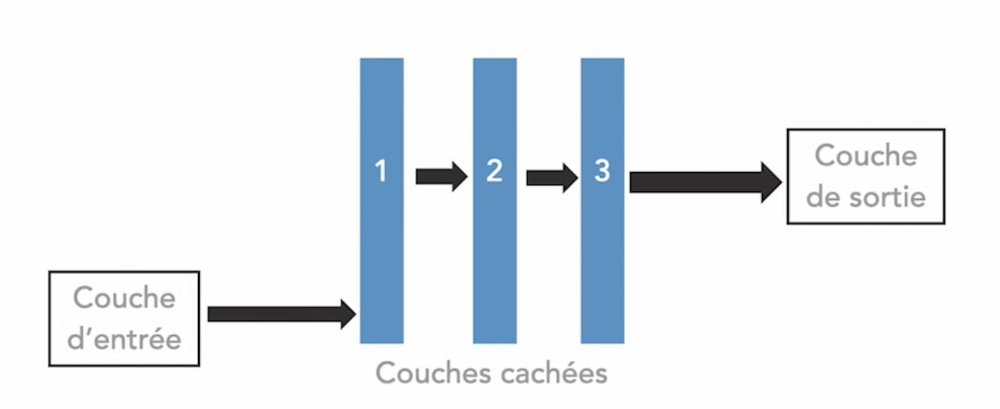

## Import des modules et des données

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import folium

In [ ]:
data = fetch_california_housing()

In [ ]:
df = pd.DataFrame(data.data, columns=data.feature_names)
df

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25
...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32


## Méthode séquentielle

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(data.data, data.target)

scaler = StandardScaler()

x_train_scaler = scaler.fit_transform(x_train)
x_test_scaler = scaler.fit_transform(x_test)

reg = keras.models.Sequential()
reg.add(keras.layers.Dense(30, activation="relu", input_shape = x_train_scaler.shape[1:]))
reg.add(keras.layers.Dense(15, activation="relu"))
reg.add(keras.layers.Dense(8, activation="relu"))
reg.add(keras.layers.Dense(1))

reg.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 30)                270       
                                                                 
 dense_1 (Dense)             (None, 15)                465       
                                                                 
 dense_2 (Dense)             (None, 8)                 128       
                                                                 
 dense_3 (Dense)             (None, 1)                 9         
                                                                 
Total params: 872
Trainable params: 872
Non-trainable params: 0
_________________________________________________________________


In [ ]:
reg.compile(loss="mse", optimizer="rmsprop", metrics=["mae"])

In [ ]:
resultats = reg.fit(x_train_scaler, y_train, epochs=10,
                    validation_data=(x_test_scaler, y_test))

Epoch 1/10
484/484 [==============================] - 2s 3ms/step - loss: 0.9747 - mae: 0.6560 - val_loss: 0.5568 - val_mae: 0.5545
Epoch 2/10
484/484 [==============================] - 1s 2ms/step - loss: 0.4186 - mae: 0.4558 - val_loss: 1.4194 - val_mae: 0.8685
Epoch 3/10
484/484 [==============================] - 1s 2ms/step - loss: 0.3813 - mae: 0.4357 - val_loss: 2.1579 - val_mae: 1.0489
Epoch 4/10
484/484 [==============================] - 1s 2ms/step - loss: 0.3638 - mae: 0.4252 - val_loss: 2.6915 - val_mae: 1.1511
Epoch 5/10
484/484 [==============================] - 2s 3ms/step - loss: 0.3536 - mae: 0.4183 - val_loss: 3.9668 - val_mae: 1.3801
Epoch 6/10
484/484 [==============================] - 2s 5ms/step - loss: 0.3490 - mae: 0.4151 - val_loss: 3.9931 - val_mae: 1.3633
Epoch 7/10
484/484 [==============================] - 2s 3ms/step - loss: 0.3420 - mae: 0.4104 - val_loss: 4.2521 - val_mae: 1.4002
Epoch 8/10
484/484 [==============================] - 1s 3ms/step - loss: 0.

In [ ]:
mae_test = reg.evaluate(x_test_scaler, y_test)

162/162 [==============================] - 0s 2ms/step - loss: 5.4118 - mae: 1.5632


## Méthode fonctionnelle - Exemple 1

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(data.data, data.target)

scaler = StandardScaler()
x_train_scaler = scaler.fit_transform(x_train)
x_test_scaler = scaler.fit_transform(x_test)

In [ ]:
input = keras.layers.Input(shape=x_train_scaler.shape[1:])
cc1 = keras.layers.Dense(30, activation="relu")(input)
cc2 = keras.layers.Dense(30, activation="relu")(cc1)
cc3 = keras.layers.Dense(30, activation="relu")(cc2)
output = keras.layers.Dense(1)(cc3)

In [ ]:
reseaux = keras.models.Model(inputs=[input], outputs=[output])

In [ ]:
reseaux.compile(loss="mse", optimizer="rmsprop", metrics=["mae"])

In [ ]:
resultats = reseaux.fit(x_train_scaler, y_train, epochs=10,
                    validation_data=(x_test_scaler, y_test))

Epoch 1/10
484/484 [==============================] - 2s 3ms/step - loss: 0.7454 - mae: 0.6039 - val_loss: 0.4306 - val_mae: 0.4791
Epoch 2/10
484/484 [==============================] - 3s 5ms/step - loss: 0.4253 - mae: 0.4506 - val_loss: 0.3873 - val_mae: 0.4374
Epoch 3/10
484/484 [==============================] - 2s 3ms/step - loss: 0.3778 - mae: 0.4317 - val_loss: 0.3543 - val_mae: 0.4181
Epoch 4/10
484/484 [==============================] - 1s 2ms/step - loss: 0.3549 - mae: 0.4194 - val_loss: 0.3371 - val_mae: 0.4069
Epoch 5/10
484/484 [==============================] - 1s 2ms/step - loss: 0.3357 - mae: 0.4082 - val_loss: 0.3247 - val_mae: 0.3951
Epoch 6/10
484/484 [==============================] - 1s 2ms/step - loss: 0.3315 - mae: 0.4018 - val_loss: 0.3384 - val_mae: 0.4080
Epoch 7/10
484/484 [==============================] - 1s 2ms/step - loss: 0.3257 - mae: 0.3947 - val_loss: 0.3736 - val_mae: 0.4399
Epoch 8/10
484/484 [==============================] - 1s 2ms/step - loss: 0.

In [ ]:
mae_test = reseaux.evaluate(x_test_scaler, y_test)

162/162 [==============================] - 0s 2ms/step - loss: 0.3385 - mae: 0.3895


## Méthode fonctionnelle - Exemple 2

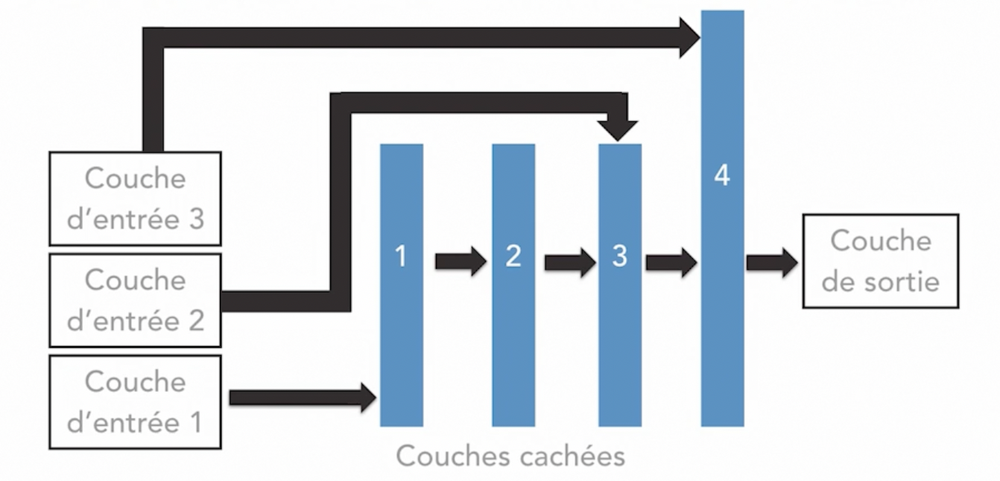

- La couche d'entrée 1 contient toutes les colonnes
- La couche d'entrée 2 contient les données de la colonne 5
- La couche d'entrée 3 contient les données de la colonne 3


In [ ]:
input_1 = keras.layers.Input(shape=x_train_scaler.shape[1:])
input_2 = keras.layers.Input(shape=[5])
input_3 = keras.layers.Input(shape=[3])

hidden1 = keras.layers.Dense(30, activation="relu")(input_1)
hidden2 = keras.layers.Dense(30, activation="relu")(hidden1)
concat_1 = keras.layers.concatenate([input_2, hidden2])

hidden3 = keras.layers.Dense(30, activation="relu")(concat_1)
concat_2 = keras.layers.concatenate([input_3, hidden3])

output = keras.layers.Dense(1)(concat_2)

model = keras.models.Model(inputs=[input_1, input_2, input_3], outputs=[output])

model.compile(loss="mse", optimizer="rmsprop", metrics=["mae"])
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_16 (InputLayer)          [(None, 8)]          0           []                               
                                                                                                  
 dense_26 (Dense)               (None, 30)           270         ['input_16[0][0]']               
                                                                                                  
 input_17 (InputLayer)          [(None, 5)]          0           []                               
                                                                                                  
 dense_27 (Dense)               (None, 30)           930         ['dense_26[0][0]']               
                                                                                            

## Méthode fonctionnelle - Exemple 3

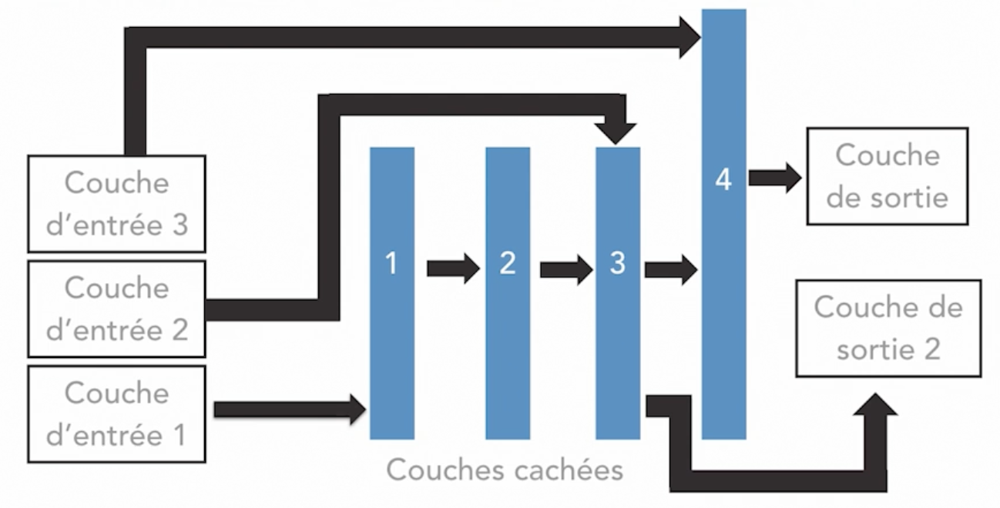

- La couche d'entrée 1 contient toutes les colonnes
- La couche d'entrée 2 contient 5 colonnes récupérées au niveau de la couche cachée 3 (les inputs sont cc3 et cc2)
- La couche d'entrée 3 contient ???

In [ ]:
input_2

<KerasTensor: shape=(None, 5) dtype=float32 (created by layer 'input_20')>

In [ ]:
input_1 = keras.layers.Input(shape=x_train_scaler.shape[1:])
input_2 = keras.layers.Input(shape=[5])
input_3 = keras.layers.Input(shape=[3])

hidden1 = keras.layers.Dense(30, activation="relu")(input_1)
hidden2 = keras.layers.Dense(30, activation="relu")(hidden1)
concat_1 = keras.layers.concatenate([input_2, hidden2])

hidden3 = keras.layers.Dense(30, activation="relu")(concat_1)
concat_2 = keras.layers.concatenate([input_3, hidden3])

output_1 = keras.layers.Dense(1)(concat_2)
output_2 = keras.layers.Dense(1)(hidden3)


model = keras.models.Model(inputs=[input_1, input_2, input_3], outputs=[output_1, output_2])

model.compile(loss="mse", optimizer="rmsprop", metrics=["mae"])
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_19 (InputLayer)          [(None, 8)]          0           []                               
                                                                                                  
 dense_30 (Dense)               (None, 30)           270         ['input_19[0][0]']               
                                                                                                  
 input_20 (InputLayer)          [(None, 5)]          0           []                               
                                                                                                  
 dense_31 (Dense)               (None, 30)           930         ['dense_30[0][0]']               
                                                                                            

# Manipuler le module OpenCV sur des images et des vidéos

## Import des modules

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
cv2.__version__

'4.1.2'

In [ ]:
help(cv2)

## Lire et afficher les caractértiques d'une image

In [ ]:
image = cv2.imread("/content/cv.jpeg")

In [ ]:
image

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

In [ ]:
type(image)

numpy.ndarray

In [ ]:
image.shape

(607, 472, 3)

In [ ]:
image.dtype

dtype('uint8')

In [ ]:
cv2.imshow("CV", image)
key = cv2.waitKey(0)
cv2.destroyAllWindows()

DisabledFunctionError: ignored

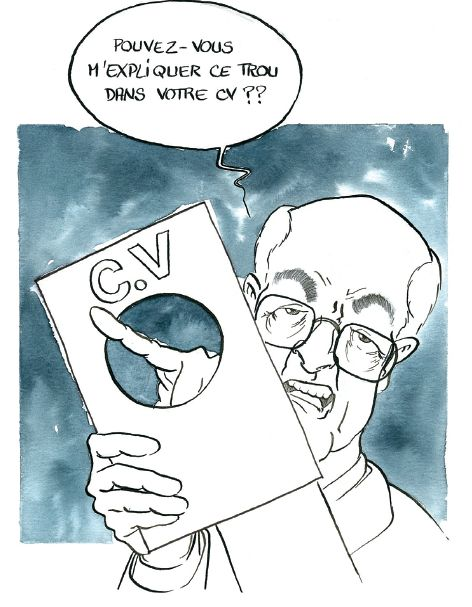

In [ ]:
cv2_imshow(image)
key = cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
imageNB = cv2.imread("/content/cv.jpeg", cv2.IMREAD_GRAYSCALE)

In [ ]:
imageNB.shape

(607, 472)

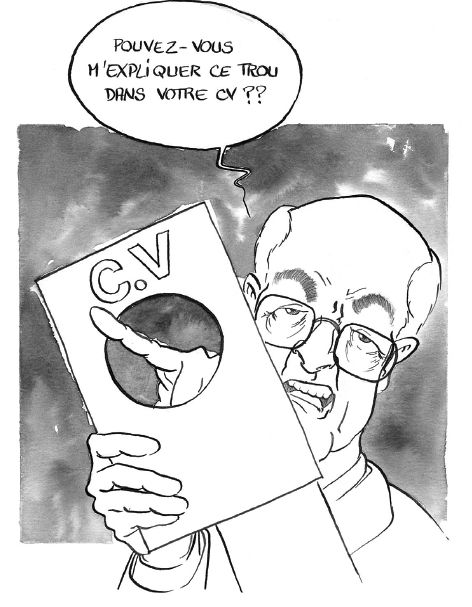

In [ ]:
cv2_imshow(imageNB)
key = cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
cv2.imwrite("Un trou dans mon CV.jpg", imageNB)

True

## Jouer avec les pixels d'une image

* pixel_b, pixel_g, pixel_r = image [ligne] [colonne]
* pixel_b, pixel_g, pixel_r = image [ligne, colonne]
* pixel = image [ligne] [colonne] [canal]
* pixel = image [ligne, colonne, canal]



In [ ]:
image = cv2.imread("/content/cv.jpeg")

In [ ]:
(b, g, r) = image[0, 0]

In [ ]:
print("Rouge: %d, Vert: %d, Bleu: %d" % (r, g, b))

Rouge: 255, Vert: 255, Bleu: 255


In [ ]:
image[0:5, :] = (0, 0, 255)

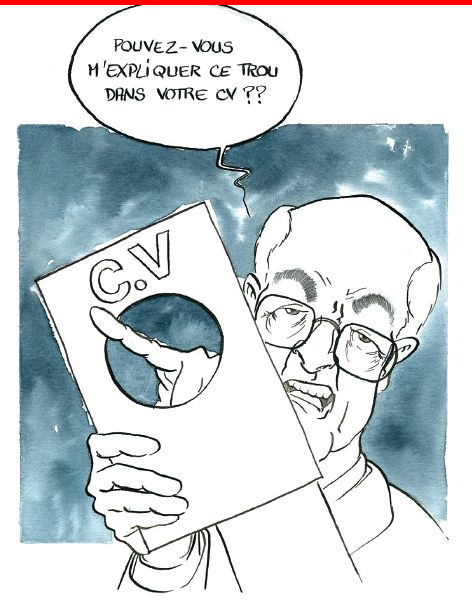

In [ ]:
cv2_imshow(image)
key = cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
imageBrouillon = image.copy()

In [ ]:
imageBrouillon[np.where((image == [255, 255, 255]).all(axis=2))] = [0, 255, 0]

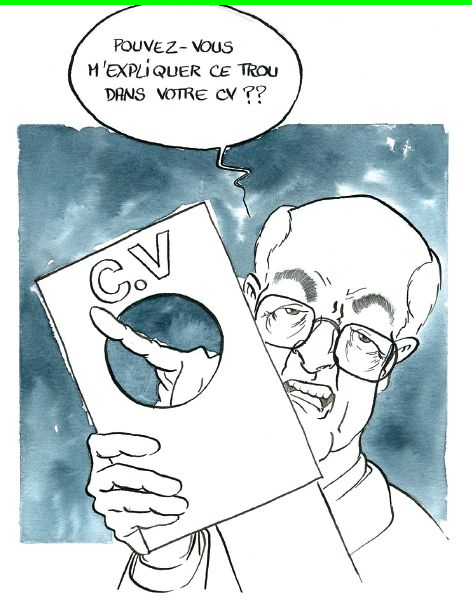

In [ ]:
cv2_imshow(imageBrouillon)
key = cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
imageBrouillon[np.where((image == [255, 255, 255]).all(axis=2))] = [255, 255, 0]

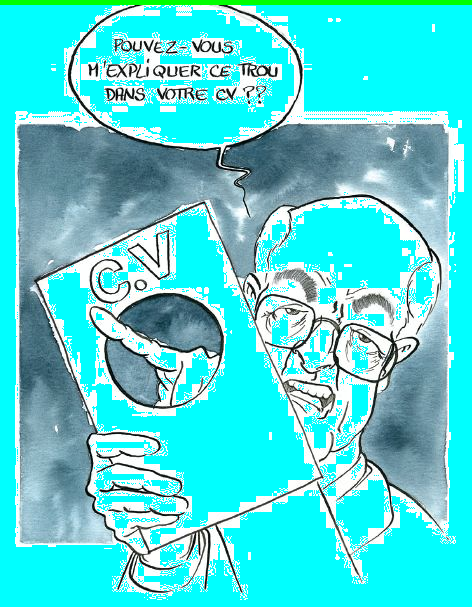

In [ ]:
cv2_imshow(imageBrouillon)
key = cv2.waitKey(0)
cv2.destroyAllWindows()

## Lire une vidéo

In [ ]:
import numpy as np
import cv2

cap = cv2.VideoCapture('/content/EN_6967196_CRS_create-a-web-application-with-django_1-0_2-2_FMD.mp4')

if cap.isOpened() == False:
    print('Cannot open file or video stream')

while True:
    ret, frame = cap.read()

    if ret == True:
        cv2.imshow('Frame', frame)

        if cv2.waitKey(25) & 0xFF == 27:
            break
    else:
        break

cap.release()
cv2.destroyAllWindows()

## Classification d'image

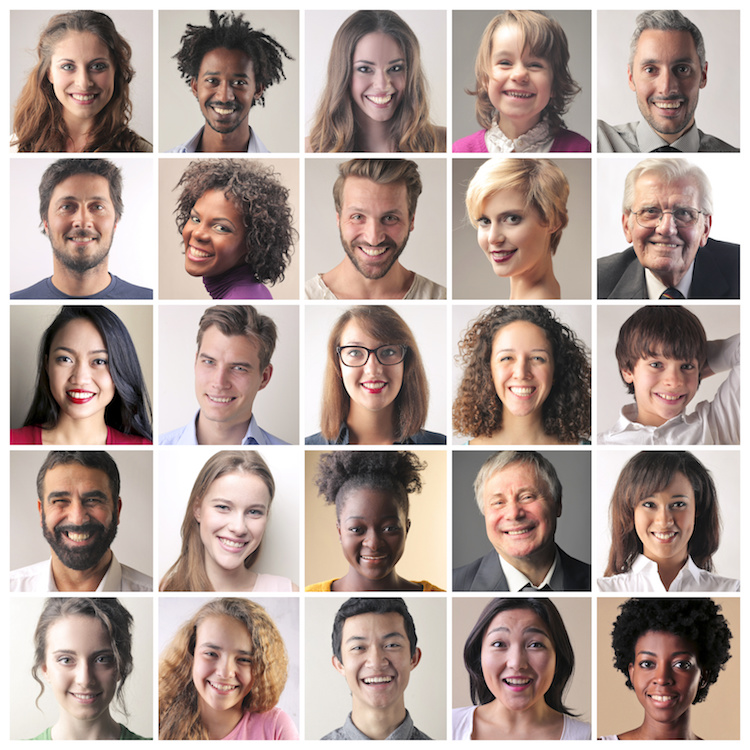

In [ ]:
cv2_imshow(cv2.imread("/content/faces.jpeg"))
key = cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
import numpy as np
import cv2

In [ ]:
visages = cv2.imread("/content/faces.jpeg")
gray = cv2.cvtColor(visages, cv2.COLOR_BGR2GRAY)
path = "/content/haarcascade_frontalface_default.xml"

In [ ]:
face_cascade = cv2.CascadeClassifier(path)

In [ ]:
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.10, minNeighbors=5, minSize=(40,40))

In [ ]:
len(faces)

24

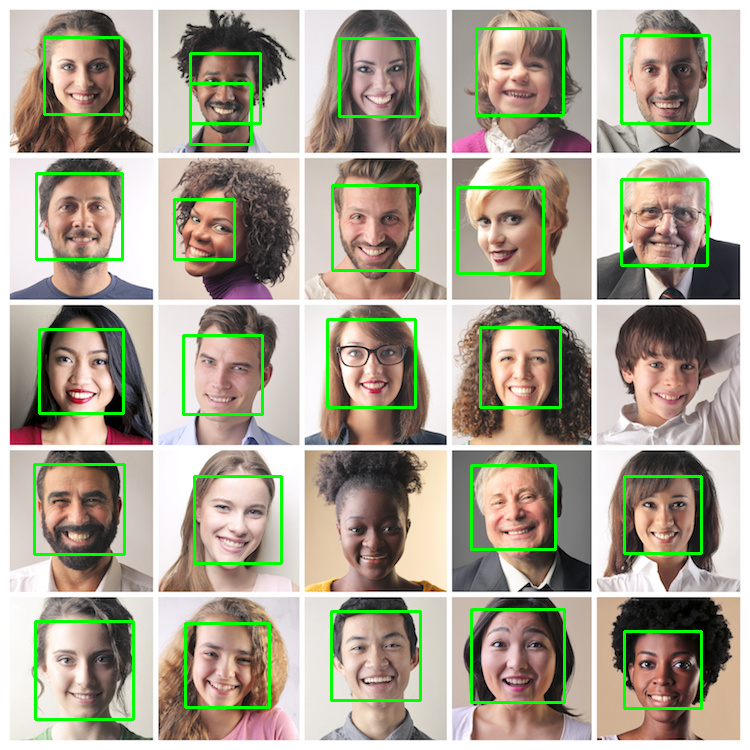

In [ ]:
for (x, y, w, h) in faces:
  cv2.rectangle(visages, (x, y), (x+w,y+h), (0, 255, 0), 2)
cv2_imshow(visages)

key = cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
help(cv2.cvtColor)

Help on built-in function cvtColor:

cvtColor(...)
    cvtColor(src, code[, dst[, dstCn]]) -> dst
    .   @brief Converts an image from one color space to another.
    .   
    .   The function converts an input image from one color space to another. In case of a transformation
    .   to-from RGB color space, the order of the channels should be specified explicitly (RGB or BGR). Note
    .   that the default color format in OpenCV is often referred to as RGB but it is actually BGR (the
    .   bytes are reversed). So the first byte in a standard (24-bit) color image will be an 8-bit Blue
    .   component, the second byte will be Green, and the third byte will be Red. The fourth, fifth, and
    .   sixth bytes would then be the second pixel (Blue, then Green, then Red), and so on.
    .   
    .   The conventional ranges for R, G, and B channel values are:
    .   -   0 to 255 for CV_8U images
    .   -   0 to 65535 for CV_16U images
    .   -   0 to 1 for CV_32F images
    .   
    .

In [ ]:
img_path = '/content/result.jpg'
#Je rajoute le parametre grayscale pour utiliser et valiser le noir et blanc.
img= image.load_img(img_path, grayscale=True, color_mode='grayscale', target_size=(28, 28))
img_tensor =image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

img_tensor /=255.

In [ ]:
#Module qui convertit l'image en grayscale
from PIL import Image
img = Image.open("/content/drive/MyDrive/Pantalon_3.jpg")
img.convert("1").save("result.jpg")

## Détecter les yeux sur une photo

In [ ]:
visages = cv2.imread("/content/faces.jpeg")
gray = cv2.cvtColor(visages, cv2.COLOR_BGR2GRAY)
path = "/content/haarcascade_eye.xml"

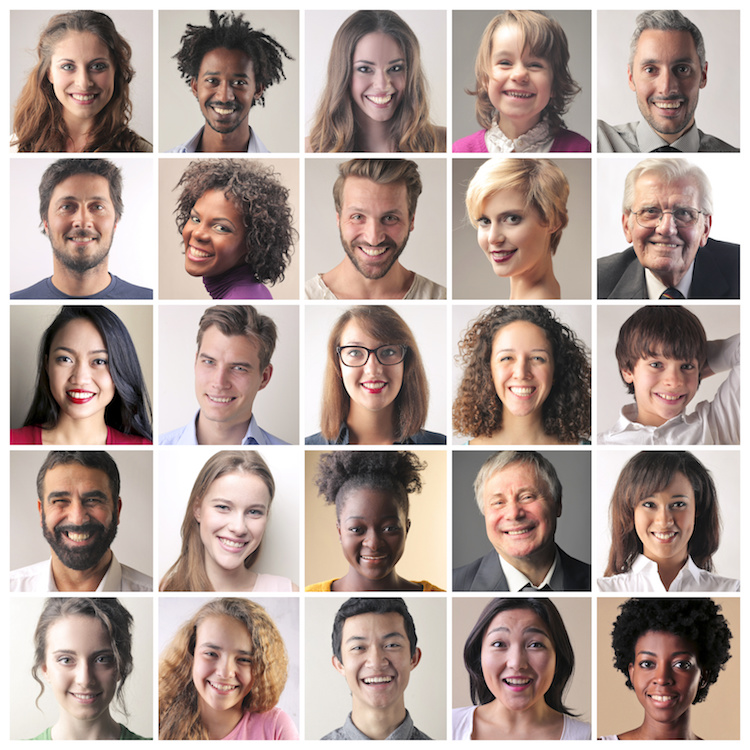

In [ ]:
cv2_imshow(visages)

key = cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
eye_cascade = cv2.CascadeClassifier("/content/haarcascade_eye.xml")

In [ ]:
eyes = eye_cascade.detectMultiScale(gray, scaleFactor=1.02,minNeighbors=20,minSize=(10,10))

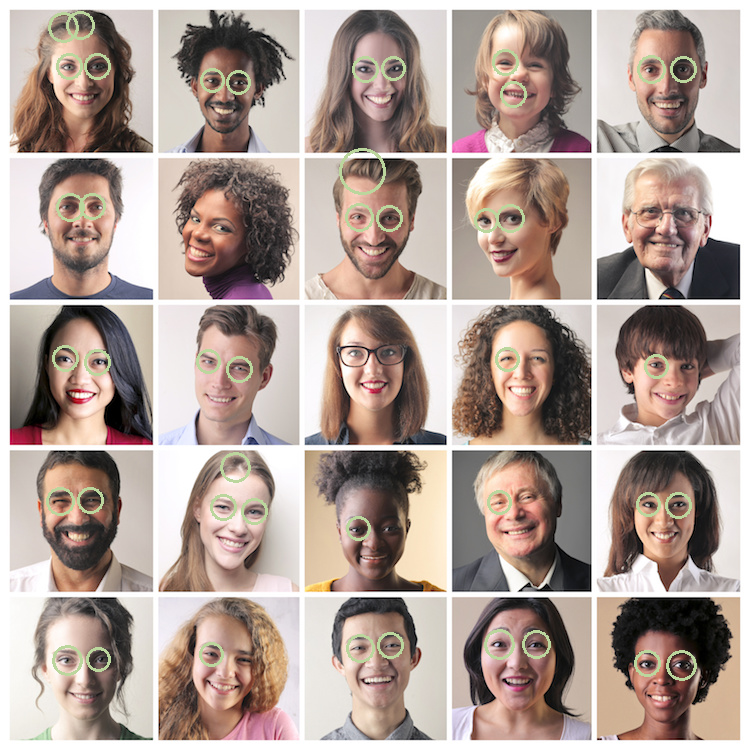

In [ ]:
for (x, y, w, h) in eyes:
  xc = (x +x+w)/2
  yc = (y + y + h)/2
  radius = w/2
  cv2.circle(visages, (int(xc),int(yc)), int(radius), (157,214,187), 2)

cv2_imshow(visages)

key = cv2.waitKey(0)
cv2.destroyAllWindows()

## Classification dans une image

In [ ]:
import numpy as np
import cv2

image = cv2.imread("/content/ordi.jpg")

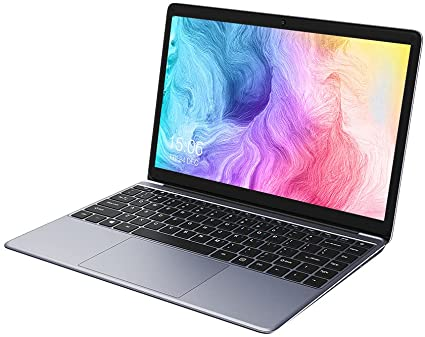

In [ ]:
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
lignes = open("/content/synset_words.txt")

In [ ]:
classes = [r[r.find(' ') + 1:] for r in lignes]

In [ ]:
classes

In [ ]:
net = cv2.dnn.readNetFromCaffe('/content/bvlc_googlenet.prototxt','/content/bvlc_googlenet.caffemodel')

In [ ]:
blob = cv2.dnn.blobFromImage(image, 1, (224, 224))

In [ ]:
net.setInput(blob)
outp = net.forward()

idx = np.argsort(outp[0])[::-1][:5]

In [ ]:
for (i,id) in enumerate(idx):
    print('{}. {} ({}): Probability {:.3}%'.format(i+1, classes[id], id, outp[0][id]*100))

1. notebook, notebook computer
 (681): Probability 85.7%
2. laptop, laptop computer
 (620): Probability 10.6%
3. desktop computer
 (527): Probability 1.24%
4. hand-held computer, hand-held microcomputer
 (590): Probability 0.606%
5. space bar
 (810): Probability 0.442%


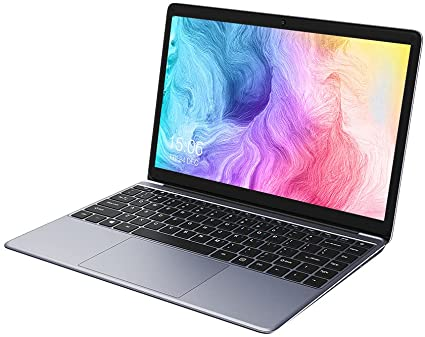

In [ ]:
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Classification dans une vidéo

In [ ]:
cap = cv2.VideoCapture("video.mp4")

lignes = open("/content/synset_words.txt")

classes = [r[r.find(' ') + 1:] for r in lignes]

net = cv2.dnn.readNetFromCaffe('/content/bvlc_googlenet.prototxt','/content/bvlc_googlenet.caffemodel')

if cap.isOpened() == False:
  print("Je ne peux pas ouvrir la vidéo")
else:
  while True:
    ret, frame = cap.read()
    blob = cv2.dnn.blobFromImage(frame, 1, (224, 224))
    net.stInput(blob)
    outp = net.forward()
    if ret == True:
        #cv2_imshow(frame)
        cv2.imshow('Frame', frame)

        if cv2.waitKey(25) & 0xFF == 27:
            break
    else:
        break

  cap.release()
  cv2.destroyAllWindows()




## Ajouter des classes à prédire avec Opencv
- https://www.youtube.com/watch?v=54WmrwVWu1w 

# Série temporelle avec du Deep learning

- AR, MA, ARMA, ARIMA

# Analyser des données sonores avec du Deep learning